<a href="https://colab.research.google.com/github/kathy1124/YOLOv8_Segmentation/blob/main/PotholesSegmentation_YOLOv8_Complete_Upload.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Select the GPU**

#**Import the Required Libraries**

In [12]:
from IPython.display import Image

#**Clone the Github Repo**

In [2]:
!git clone https://github.com/MuhammadMoin97/ultralytics.git

fatal: destination path 'ultralytics' already exists and is not an empty directory.


#**Set the Current Directory**

In [3]:
%cd /content/ultralytics

/content/ultralytics


#**Install all the Dependencies**

In [ ]:
!pip install -e .'[dev]'

#**Moving to the Segmentation Directory**

In [6]:
%cd /content/ultralytics/ultralytics/yolo/v8/segment

/content/ultralytics/ultralytics/yolo/v8/segment


In [7]:
!pwd

/content/ultralytics/ultralytics/yolo/v8/segment


#**Import the Dataset From Roboflow  into the GoogleColab**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="3V0dDFy4Srmx0xfN0b0R")
project = rf.workspace("classification-btt2b").project("potholes_segmentation-jvwij")
version = project.version(1)
dataset = version.download("yolov5")

#**Training the Model**

In [5]:
HOME = "/content/ultralytics/ultralytics/yolo/v8/segment"

In [6]:
dataset.location

'/content/ultralytics/Potholes_Segmentation-1'

In [7]:
!pip install --upgrade "pillow<10.0"

In [ ]:
%cd {HOME}

!python train.py model=yolov8l-seg.pt data={dataset.location}/data.yaml epochs=120 imgsz=640

#*Checking the Files in the Training Folder**

In [9]:
!ls /content/ultralytics/runs/segment/train2

ls: cannot access '/content/ultralytics/runs/segment/train2': No such file or directory


#**Validate the Custom Model**

In [ ]:
!python val.py model='/content/ultralytics/runs/segment/train2/weights/best.pt' data={dataset.location}/data.yaml

#**Predictions on Validation Batch as well**

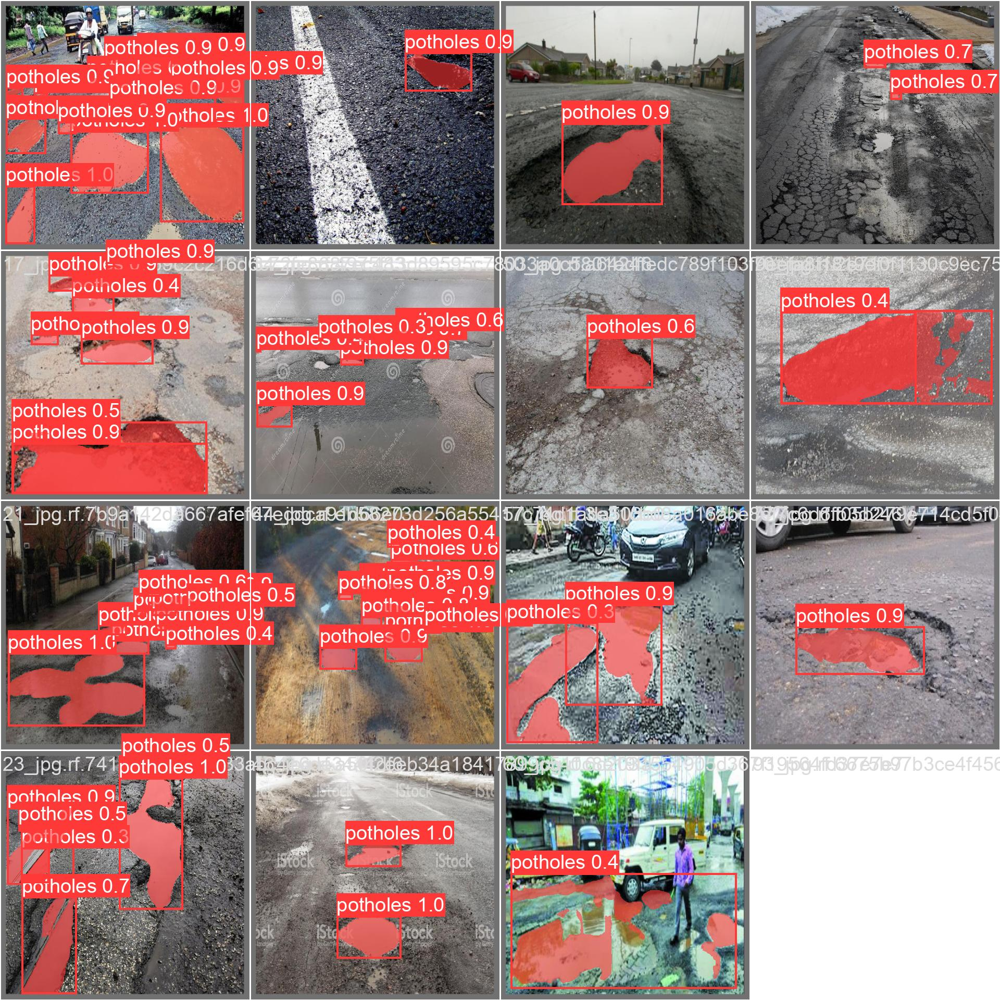

In [14]:
Image("/content/ultralytics/runs/segment/train/val_batch0_pred.jpg")

#**Display the Confusion Matrix**

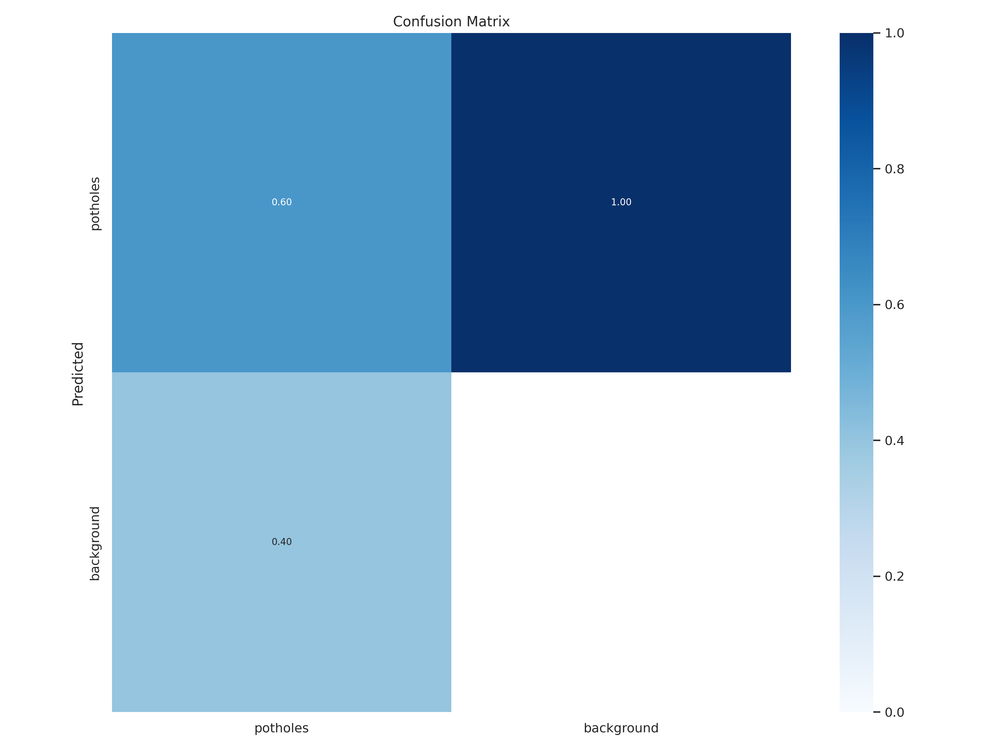

In [16]:
Image("//content/ultralytics/runs/segment/train/confusion_matrix.png")

#**Train and Validation Losses**

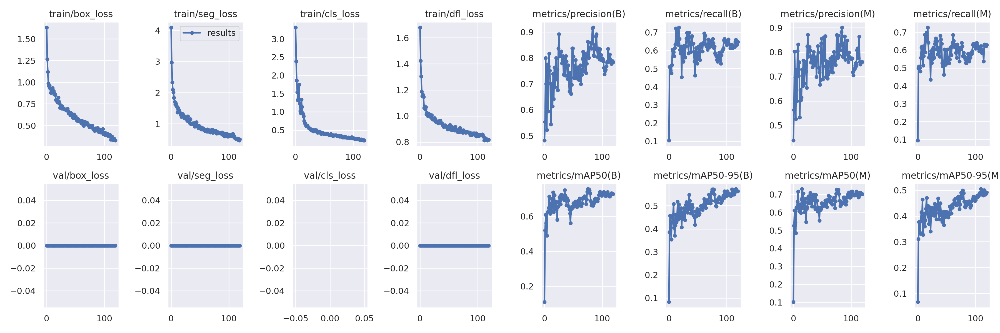

In [17]:
Image("/content/ultralytics/runs/segment/train/results.png")

#**Downloading the Demo Video**

In [ ]:
!gdown "https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t
To: /content/ultralytics/ultralytics/yolo/v8/segment/demo.mp4
100% 4.39M/4.39M [00:00<00:00, 239MB/s]


#**Downloading the Weights File From the Drive**

In [ ]:
!gdown "https://drive.google.com/uc?id=1V2k7WF3hgx7wKMwO3G-DVOCGeI73xlGf&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1V2k7WF3hgx7wKMwO3G-DVOCGeI73xlGf&confirm=t
To: /content/best.pt
100% 92.3M/92.3M [00:01<00:00, 49.4MB/s]


#**Testing the Model**

In [ ]:
!python predict.py model='/content/ultralytics/runs/segment/train/weights/best.pt' source='demo.mp4'

#**Display the Demo Video**

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/runs/detect/train4/demo.mp4'

# Compressed video path
compressed_path = "/content/ultralytics/runs/detect/train2/demo.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
!zip -r /content/ultralytics.zip /content/ultralytics

In [19]:
from google.colab import files
files.download('/content/ultralytics.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>